In [38]:
import pandas as pd
import numpy as np
import altair as alt
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.dummy import DummyRegressor
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, ElasticNet, BayesianRidge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
import warnings

In [2]:
warnings.filterwarnings('ignore')

# Load the Walmart sales dataset from the local 'data' directory
data = pd.read_csv('data/walmart-sales-dataset.csv')

# Display the first five rows to get an overview of the dataset structure
data.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [3]:
# Display a concise summary of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [4]:
# Generate descriptive statistics
data.describe().round(3)

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000,6435.000,6435.000,6435.000,6435.000,6435.000,6435.000
mean,23.000,1046964.878,0.070,60.664,3.359,171.578,7.999
std,12.988,564366.622,0.255,18.445,0.459,39.357,1.876
min,1.000,209986.250,0.000,-2.060,2.472,126.064,3.879
25%,12.000,553350.105,0.000,47.460,2.933,131.735,6.891
50%,23.000,960746.040,0.000,62.670,3.445,182.617,7.874
75%,34.000,1420158.660,0.000,74.940,3.735,212.743,8.622
max,45.000,3818686.450,1.000,100.140,4.468,227.233,14.313


**Exploratory Data Analysis**

In [5]:
# Disable Altair’s default 5000-row limit to allow rendering of large datasets
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

Average Weekly Sales for Different Stores

In [6]:
alt.Chart(data, title = "Avg Weekly Sales for Different Stores").mark_bar().encode(
x = 'Store',
y = 'mean(Weekly_Sales)').properties(width = 700, height = 550)

alt.Chart(...)

_Insight_: A few stores (e.g., 4, 14, 20, 27) have significantly higher average weekly sales (> $2M), indicating strong location or operational advantages, while many others fall below $1M.

Relationship Between Temperature and Average Weekly Sales

In [7]:
alt.Chart(data, title = "Temperature vs Weekly Sales").mark_point(size = 40).encode(
x = 'Temperature',
y = 'mean(Weekly_Sales)').properties(width = 700, height = 550)

alt.Chart(...)

_Insight_: There is no clear correlation between temperature and average weekly sales, indicating sales remain relatively stable across varying temperatures.

Impact of Temperature Ranges on Weekly Sales

In [8]:
alt.Chart(data, title = 'Impact of Temperature Ranges on Weekly Sales').mark_bar().encode(
    alt.X("Temperature:Q", bin = True),
    y = 'Weekly_Sales',
)

alt.Chart(...)

_Insight_: Weekly sales tend to be lower during periods of extreme temperatures, with peak sales occurring in moderate temperature ranges.

Distribution of holiday and non-holiday weeks

In [9]:
data['Holiday_Flag'].value_counts()

Holiday_Flag
0    5985
1     450
Name: count, dtype: int64

In [10]:
alt.Chart(data, title = 'Comparison of Avg Weekly Sales During Holiday and Non-Holiday Weeks').mark_bar().encode(
    alt.X("Holiday_Flag:O"),
    y = 'mean(Weekly_Sales)',
    color = 'Holiday_Flag'
).properties(width = 200, height = 350)

alt.Chart(...)

_Insight_: Weeks with holidays show a higher average in weekly sales, likely driven by increased consumer spending during festive periods.

Impact of Fuel Price on Average Weekly Sales

In [11]:
alt.Chart(data, title="Impact of Fuel Price on Average Weekly Sales").mark_line().encode(
x = 'Fuel_Price',
y = 'mean(Weekly_Sales)').properties(width = 600, height = 550)

alt.Chart(...)

_Insight_: Weekly sales remain relatively stable across varying fuel prices

Effect of Consumer Price Index (CPI) on Average Weekly Sales

In [12]:
alt.Chart(data, title = "Effect of CPI on Avg Weekly Sales").mark_line().encode(
x = 'CPI',
y = 'mean(Weekly_Sales)').properties(width = 600, height = 550)

alt.Chart(...)

_Insight_: Weekly sales show noticeable fluctuations across different CPI ranges, with a decline in average sales observed as CPI increases beyond 200, suggesting possible sensitivity to rising prices.

Relationship Between Unemployment Rate and Average Weekly Sales

In [13]:
alt.Chart(data, title = "Relationship Between Unemployment Rate and Avg Weekly Sales").mark_line().encode(
x = 'Unemployment',
y = 'mean(Weekly_Sales)').properties(width = 600, height = 550)

alt.Chart(...)

_Insight_:  Weekly sales tend to fluctuate more at lower unemployment rates, while higher unemployment is generally associated with lower and more stable sales

Splitting the Date to weeks, months and years.

In [14]:
data['Date'] = pd.to_datetime(data['Date'], format = '%d-%m-%Y')
data['week'] = data['Date'].dt.isocalendar().week
data['month'] = data['Date'].dt.month 
data['year'] = data['Date'].dt.year

In [15]:
data['Weekly_Sales'] = data['Weekly_Sales'].fillna(0).astype(np.int64)
data['Weekly_Sales'] = data['Weekly_Sales'].astype('Int64')

In [16]:
alt.Chart(data, title = "Average Weekly Sales by Month").mark_bar().encode(
x = 'month',
y = 'mean(Weekly_Sales)',
color = "month:N"
).properties(width = 700, height = 550)

alt.Chart(...)

_Insight_: December records the highest average weekly sales, likely driven by the holiday shopping season and year-end festivities.

In [17]:
chart = alt.Chart(data, title = "Average Weekly Sales by Week of the Year").mark_bar().encode(
x = 'week',
y = 'mean(Weekly_Sales)',
color = "week:N"
).properties(width = 700, height = 550)

chart.display()

alt.Chart(...)

_Insight_: Week 51 shows the highest spike in average weekly sales, likely influenced by the Christmas

In [18]:
alt.Chart(data, title = 'Monthly Sales Trend Comparison Across Years').mark_bar().encode(
    x = "month:N",
    y = 'Weekly_Sales',
    column = 'year:O',
    color = 'year:O'
).properties(width = 200, height = 350)

alt.Chart(...)

_Insight_: Year 2012 shows the highest overall monthly peaks

***Feature selection and Feature engineering***

Text(0.5, 1.0, 'Correlation Matrix of Key Features')

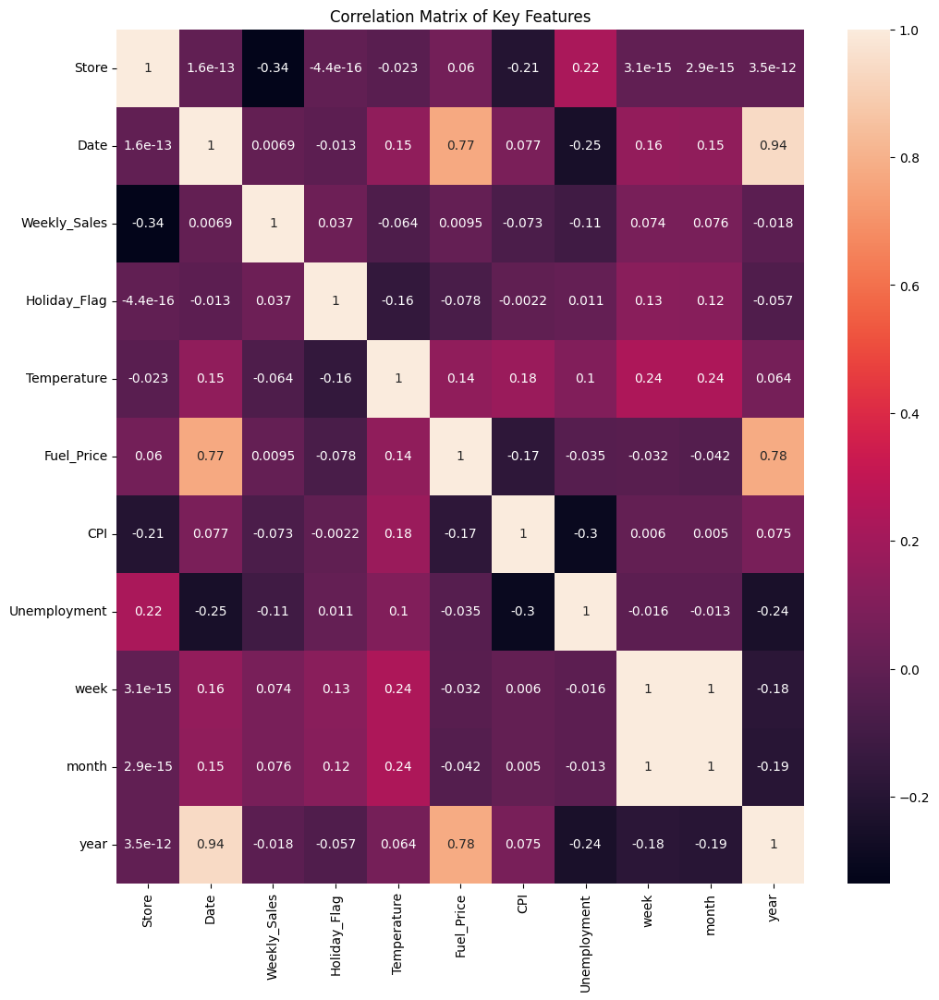

In [19]:
plt.figure(figsize = (12, 12))
sns.heatmap(data.corr(), annot = True)
plt.title('Correlation Matrix of Key Features')

Weekly_Sales shows a weak negative correlation with Store and Unemployment, and minimal correlation with most other features, indicating that no single variable strongly drives sales alone.

In [20]:
features = ['Store', 'Holiday_Flag', 'Temperature', 'Fuel_Price', 'CPI', 'Unemployment', 'week', 'month', 'year']
X = data[features]
y = data['Weekly_Sales']

In [21]:
# Splitting into training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 25)

In [22]:
# describing X_train
X_train.shape

(5148, 9)

In [23]:
# Describing X
X.head()

,Store,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,week,month,year
0,1,0,42.31,2.572,211.096358,8.106,5,2,2010
1,1,1,38.51,2.548,211.242170,8.106,6,2,2010
2,1,0,39.93,2.514,211.289143,8.106,7,2,2010
3,1,0,46.63,2.561,211.319643,8.106,8,2,2010
4,1,0,46.50,2.625,211.350143,8.106,9,3,2010


Creating the baseline

In [24]:
#Using mean as the baseline
dummy_regr = DummyRegressor(strategy = "mean") #Using mean as the baseline
col_transformer = ColumnTransformer(
        [('robust_scaler', RobustScaler, ['Temprature', 'Fuel_Price', 'CPI', 'Unemployment'])],
        remainder='passthrough'
        )
# using Pipeline
pipe = Pipeline(
        [
         ('robust_scaler', RobustScaler()),
         ('Dummy Regressor', dummy_regr)
        ])

pipe.fit(X_train, y_train)
y_pred = pipe.predict(X_test)
# Prining mean squared error and round to 2 decimal places
print("Mean Squared Error: ", mean_squared_error(y_test, y_pred))

Mean Squared Error:  333966925169.9645


In [25]:
# Column Transformation 
col_transformer = ColumnTransformer(
        [('robust_scaler', RobustScaler, ['Temprature', 'Fuel_Price', 'CPI', 'Unemployment'])],
        remainder = 'passthrough'
        )

Linear Regression

In [26]:
lin_reg = LinearRegression()
lin_reg_param = {'Linear_Regression__fit_intercept':[True,False]}
lin_reg_pipe = Pipeline(
    [
        ('robust_scalar', RobustScaler()),
        ('Linear_Regression', lin_reg)
    ]
)

lin_reg_search = GridSearchCV(lin_reg_pipe, lin_reg_param, scoring = 'neg_root_mean_squared_error')
lin_reg_search.fit(X_train, y_train)
print("Linear Regression")
print("Best Score: ", lin_reg_search.best_score_.__round__(3))
print("Best hyperparameters: ", lin_reg_search.best_params_)

Linear Regression
Best Score:  -519971.799
Best hyperparameters:  {'Linear_Regression__fit_intercept': True}


Random Forest

In [27]:
random_forest_reg = RandomForestRegressor()
random_forest_reg_param = {
    'Random_Forest_Regressor__n_estimators': [100, 200, 300, 400],
    'Random_Forest_Regressor__min_samples_leaf': [3, 4, 5]
}
random_forest_reg_pipe = Pipeline(
    [
        ('robust_scalar', RobustScaler()),
        ('Random_Forest_Regressor', random_forest_reg)
    ]
)

random_forest_reg_search = GridSearchCV(random_forest_reg_pipe, random_forest_reg_param, scoring = 'neg_root_mean_squared_error')
random_forest_reg_search.fit(X_train, y_train)
print("Random Forest Regressor")
print("Best Score: ", random_forest_reg_search.best_score_.__round__(3))
print("Best hyperparameters: ", random_forest_reg_search.best_params_)

Random Forest Regressor
Best Score:  -114327.585
Best hyperparameters:  {'Random_Forest_Regressor__min_samples_leaf': 3, 'Random_Forest_Regressor__n_estimators': 400}


Ridge Regression

In [28]:
ridge_reg = Ridge()
ridge_reg_param = {
    'Ridge_Regressor__alpha': [0.01, 0.1, 1, 10]
}
ridge_reg_pipe = Pipeline(
    [
        ('robust_scalar', RobustScaler()),
        ('Ridge_Regressor', ridge_reg)
    ]
)
ridge_reg_search = GridSearchCV(ridge_reg_pipe, ridge_reg_param, scoring = 'neg_root_mean_squared_error')
ridge_reg_search.fit(X_train, y_train)
print("Ridge Regressor")
print("Best Score: ", ridge_reg_search.best_score_.__round__(3))
print("Best hyperparameters: ", ridge_reg_search.best_params_)

Ridge Regressor
Best Score:  -519963.901
Best hyperparameters:  {'Ridge_Regressor__alpha': 1}


KNN Regression

In [29]:
knn_reg = KNeighborsRegressor()
knn_reg_param = {
    'KNeighbors_Regressor__n_neighbors': [3, 5, 7, 9, 11, 13, 15, 17, 21]
}
knn_reg_pipe = Pipeline(
    [
        ('robust_scalar', RobustScaler()),
        ('KNeighbors_Regressor', knn_reg)
    ]
)
knn_reg_search = GridSearchCV(knn_reg_pipe, knn_reg_param, scoring = 'neg_root_mean_squared_error')
knn_reg_search.fit(X_train, y_train)
print("KNeighbors Regressor")
print("Best Score: ", knn_reg_search.best_score_.__round__(3))
print("Best hyperparameters: ", knn_reg_search.best_params_)

KNeighbors Regressor
Best Score:  -368593.618
Best hyperparameters:  {'KNeighbors_Regressor__n_neighbors': 3}


Gradient Booster Regressor

In [30]:
gb_reg = GradientBoostingRegressor()
gb_reg_param = {
    'Gradient_Boosting_Regressor__max_depth': range(5,16,2),
    'Gradient_Boosting_Regressor__min_samples_split': range(200,1001,200)
}
gb_reg_pipe = Pipeline(
    [
        ('robust_scalar', RobustScaler()),
        ('Gradient_Boosting_Regressor', gb_reg)
    ]
)
gb_reg_search = GridSearchCV(gb_reg_pipe, gb_reg_param, scoring = 'neg_root_mean_squared_error')
gb_reg_search.fit(X_train, y_train)
print("Gradient Boosting Regressor")
print("Best Score: ", gb_reg_search.best_score_.__round__(3))
print("Best hyperparameters: ", gb_reg_search.best_params_)

Gradient Boosting Regressor
Best Score:  -103296.113
Best hyperparameters:  {'Gradient_Boosting_Regressor__max_depth': 15, 'Gradient_Boosting_Regressor__min_samples_split': 200}


Multi Layer Perceptron Regressor

In [31]:
mlp_reg = MLPRegressor()
mlp_reg_param = {
    'Multi_Layer_Perceptron_Regressor__activation':['identity','relu','logistic'],
    'Multi_Layer_Perceptron_Regressor__alpha':[1.e-06, 1.e-05, 1.e-04, 1.e-03]
}
mlp_reg_pipe = Pipeline(
    [
        ('robust_scalar', RobustScaler()),
        ('Multi_Layer_Perceptron_Regressor', mlp_reg)
    ]
)
mlp_reg_search = GridSearchCV(mlp_reg_pipe, mlp_reg_param, scoring = 'neg_root_mean_squared_error')
mlp_reg_search.fit(X_train, y_train)
print("Multi Layer Perceptron Regressor")
print("Best Score: ", mlp_reg_search.best_score_.__round__(3))
print("Best hyperparameters: ", mlp_reg_search.best_params_)

Multi Layer Perceptron Regressor
Best Score:  -1178247.807
Best hyperparameters:  {'Multi_Layer_Perceptron_Regressor__activation': 'identity', 'Multi_Layer_Perceptron_Regressor__alpha': 1e-05}


Support Vector Machine Regressor

In [32]:
svm_reg = SVR()
svm_reg_param = {
    'Support_Vector_Regressor__kernel':['linear','poly','rbf','poly'],
    'Support_Vector_Regressor__C':[0.1, 1, 10],
    'Support_Vector_Regressor__epsilon': [0.01, 0.1, 1],
    'Support_Vector_Regressor__gamma': ['scale', 'auto', 0.1, 1, 10]
}
svm_reg_pipe = Pipeline(
    [
        ('robust_scalar', RobustScaler()),
        ('Support_Vector_Regressor', svm_reg)
    ]
)
svm_reg_search = GridSearchCV(svm_reg_pipe, svm_reg_param, scoring = 'neg_root_mean_squared_error')
svm_reg_search.fit(X_train, y_train)
print("Support Vector Regressor")
print("Best Score: ", svm_reg_search.best_score_.__round__(3))
print("Best hyperparameters: ", svm_reg_search.best_params_)

Support Vector Regressor
Best Score:  -482474.403
Best hyperparameters:  {'Support_Vector_Regressor__C': 10, 'Support_Vector_Regressor__epsilon': 1, 'Support_Vector_Regressor__gamma': 10, 'Support_Vector_Regressor__kernel': 'poly'}


Bayesian Linear Regressor

In [33]:
bay_reg = BayesianRidge()
bay_reg_param = {
    'Bayesian_Regressor__alpha_1': [1e-6, 1e-4, 1e-2, 1.0],
    'Bayesian_Regressor__alpha_2': [1e-6, 1e-4, 1e-2, 1.0],
    'Bayesian_Regressor__lambda_1': [1e-6, 1e-4, 1e-2, 1.0],
    'Bayesian_Regressor__lambda_2': [1e-6, 1e-4, 1e-2, 1.0],
    'Bayesian_Regressor__tol': [1e-6, 1e-4, 1e-2],
    'Bayesian_Regressor__compute_score': [True, False]
}
bay_reg_pipe = Pipeline(
    [
        ('robust_scalar', RobustScaler()),
        ('Bayesian_Regressor', bay_reg)
    ]
)
bay_reg_search = GridSearchCV(bay_reg_pipe, bay_reg_param, scoring = 'neg_root_mean_squared_error')
bay_reg_search.fit(X_train, y_train)
print("Bayesian Regressor")
print("Best Score: ", bay_reg_search.best_score_.__round__(3))
print("Best hyperparameters: ", bay_reg_search.best_params_)

Bayesian Regressor
Best Score:  -519993.654
Best hyperparameters:  {'Bayesian_Regressor__alpha_1': 1.0, 'Bayesian_Regressor__alpha_2': 1e-06, 'Bayesian_Regressor__compute_score': True, 'Bayesian_Regressor__lambda_1': 1e-06, 'Bayesian_Regressor__lambda_2': 1.0, 'Bayesian_Regressor__tol': 1e-06}


Elastic Net Regressor

In [34]:
elasticnet_reg = ElasticNet(random_state=0)
elasticnet_reg_param = {
    'ElasticNet_Regressor__alpha': [0.1, 1.0, 10.0],
    'ElasticNet_Regressor__l1_ratio': [0.1, 0.5, 0.9],
    'ElasticNet_Regressor__fit_intercept': [True, False],
    'ElasticNet_Regressor__max_iter': [1000, 5000, 10000]
}
elasticnet_reg_pipe = Pipeline(
    [
        ('robust_scalar', RobustScaler()),
        ('ElasticNet_Regressor', elasticnet_reg)
    ]
)
elasticnet_reg_search = GridSearchCV(elasticnet_reg_pipe, elasticnet_reg_param, scoring = 'neg_root_mean_squared_error')
elasticnet_reg_search.fit(X_train, y_train)
print("Elastic Net Regressor")
print("Best Score: ", elasticnet_reg_search.best_score_.__round__(3))
print("Best hyperparameters: ", elasticnet_reg_search.best_params_) 

Elastic Net Regressor
Best Score:  -520036.813
Best hyperparameters:  {'ElasticNet_Regressor__alpha': 0.1, 'ElasticNet_Regressor__fit_intercept': True, 'ElasticNet_Regressor__l1_ratio': 0.9, 'ElasticNet_Regressor__max_iter': 1000}


AdaBoost Regressor

In [35]:
ab_reg = AdaBoostRegressor()
ab_reg_param = {
    'AdaBoost_Regressor__n_estimators': [50, 100, 200],
    'AdaBoost_Regressor__learning_rate': [0.01, 0.1, 1.0],
    'AdaBoost_Regressor__loss': ['linear', 'square', 'exponential']
}
ab_reg_pipe = Pipeline(
    [
        ('robust_scalar', RobustScaler()),
        ('AdaBoost_Regressor', ab_reg)
    ]
)
ab_reg_search = GridSearchCV(ab_reg_pipe, ab_reg_param, scoring = 'neg_root_mean_squared_error')
ab_reg_search.fit(X_train, y_train)
print("AdaBoost Regressor")
print("Best Score: ", ab_reg_search.best_score_.__round__(3))
print("Best hyperparameters: ", ab_reg_search.best_params_)

AdaBoost Regressor
Best Score:  -416819.575
Best hyperparameters:  {'AdaBoost_Regressor__learning_rate': 0.01, 'AdaBoost_Regressor__loss': 'exponential', 'AdaBoost_Regressor__n_estimators': 200}


**Gradient Boosting Regressor is the Best Model**

_Compared to others, Gradient Boosting achieved the smallest RMSE, meaning its predictions were closest to the actual weekly sales on average_

Running the best model on Test data set

In [36]:
best_model = gb_reg_search.best_estimator_
best_model.fit(X_train, y_train)

Pipeline(steps=[('robust_scalar', RobustScaler()),
                ('Gradient_Boosting_Regressor',
                 GradientBoostingRegressor(max_depth=15,
                                           min_samples_split=200))])

In [40]:
y_pred = best_model.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2score = r2_score(y_test, y_pred)

In [42]:
print('AFTER TESTING THE BEST MODEL')

print('Root Mean Squared Error:', round(rmse, 3))
print('Test Mean Absolute Error:', round(mae, 3))
print('Test R2 score:', round(r2score, 3))

AFTER TESTING THE BEST MODEL
Root Mean Squared Error: 94288.895
Test Mean Absolute Error: 54381.644
Test R2 score: 0.973


In [43]:
print('The Gradient Boosting Algorithm explains ', round(r2score*100, 2), '% of the variation in the data')

The Gradient Boosting Algorithm explains  97.33 % of the variation in the data


In [44]:
feature_imp = pd.DataFrame(data = {'Features':list(X.columns), "importance":list(best_model['Gradient_Boosting_Regressor'].feature_importances_)})

In [45]:
alt.Chart(feature_imp,title ='Gradient Boosting Regression Feature Importance').mark_bar().encode(
    x = "Features",
    y ='importance',
    color ='Features'
).properties(width = 500, height = 450)

alt.Chart(...)